<a href="https://colab.research.google.com/github/CeoJim18/butterfly-recognition-AI/blob/main/ButterflyAITrainingground.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install tensorflowjs

INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 27.5 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.1
    Uninstalling tensorboard-2.17.1:
      Successfully unin

In [1]:
# INITIALIZATION OF CERTAIN VARIABLES (verplicht runnen)
import os

# paths and folders:
googleDrivePath= "/content/drive/MyDrive/"
modelKerasPath = googleDrivePath + "AI_model_keras/"
modelTFLitePath = googleDrivePath + "AI_model_tflite/"
collectedButterflyImagesPath= googleDrivePath + "collected_butterfly_images/"
butterflyDatasetImagesPath= googleDrivePath + "butterfly_dataset_images/"
augmentedButterflyImagesPath= googleDrivePath + "augmented_butterfly_images/"
trainingAndValidationDatasetFolder ="training_and_validation_data/"
modelTrainingLogsPath= googleDrivePath + "model_training_logs/"
testButterflyImages = googleDrivePath + "test_images/butterflies/"
testNonButterflyImages = googleDrivePath + "test_images/non_butterflies/"
YOLOModelPath= googleDrivePath + "YOLO_models/"
YOLODatasetsPath= googleDrivePath + "YOLO_datasets/"

# AI model name
model_name = "ButterflyModel"

# CREATE TARGET FOLDER
target_folder = googleDrivePath + trainingAndValidationDatasetFolder
existDataSetPath = os.path.exists(target_folder)

if existDataSetPath==False:
  os.mkdir(target_folder)
  print("Target folder created")
else:
  print("Target folder already exists, will not create it!")

Target folder already exists, will not create it!


In [2]:
# NECESSARY FUNCTIONS FOR FOLDERS (verplicht runnen)
import os
import shutil
from pathlib import Path

# important functions used in the project:

# put a directory. if it does not exist, this function will create it
def check_and_create_folder(folder_path):

  if not os.path.exists(folder_path):
    os.makedirs(folder_path)
    print(f"Map '{folder_path}' is created.")
  else:
    print(f"Map '{folder_path}' already exists.")

def get_all_folders_in_directory(directory_path: str) -> list:
# Initialize an empty list to hold the folder paths
    folder_paths = []

    # List all items in the current directory
    for item in os.listdir(directory_path):
        full_path = os.path.join(directory_path, item)

        # Check if the item is a directory (exclude files)
        if os.path.isdir(full_path):
            print('Folder selected: ' + item)
            folder_paths.append(full_path)

    return folder_paths

def copy_all_files_in_dirs(src_dirs: list, dst_base_dir: str):
    """
    Copies all files from multiple directories (src_dirs) into corresponding subdirectories in dst_base_dir.
    If a directory from src_dirs does not exist, it will skip it.
    """
    for src_dir in src_dirs:
        # Use the last part of src_dir as the subfolder name in the destination
        # print('NU KOMT DIE ANGLES!')
        threeFolders = get_all_folders_in_directory(src_dir)
        butterflySpecieFolder = os.path.basename(os.path.normpath(src_dir))

        for threeFolder in threeFolders:
          dst_dir_file = os.path.join(dst_base_dir, butterflySpecieFolder)
          try:
            copy_files(threeFolder, dst_dir_file)
            print(f"Copied files from {threeFolder} to {dst_dir_file}")
          except FileNotFoundError as e:
            print(f"Skipping {threeFolder}: {e}")

# Example usage:
# source_dirs = ["./source1", "./source2", "./source3"]
# destination_base = "./destination"
# copy_all_files_in_dirs(source_dirs, destination_base)


def copy_files(src_dir: str, dst_dir: str):
    """
    Copies all files from src_dir to dst_dir. If the destination directory does not exist, it will be created.
    """
    # Ensure src_dir exists
    if not os.path.exists(src_dir):
        raise FileNotFoundError(f"Source directory {src_dir} does not exist.")

    # Create destination directory if it doesn't exist
    Path(dst_dir).mkdir(parents=True, exist_ok=True)

    # Copy each file in the src_dir to dst_dir
    for file_name in os.listdir(src_dir):
        src_file = os.path.join(src_dir, file_name)
        dst_file = os.path.join(dst_dir, file_name)

        # Only copy if it is a file
        if os.path.isfile(src_file):
            shutil.copy2(src_file, dst_file)


def remove_unwanted_dir(path, unwanted_dirs):
      for unwanted_dir in unwanted_dirs:
        dir_path = os.path.join(path, unwanted_dir)
        if os.path.exists(dir_path) and os.path.isdir(dir_path):
            shutil.rmtree(dir_path)
            print(f"Removed directory: {dir_path}")


def clear_folder_content(folder_path):
    """
    Removes all contents of a specified folder.
    """
    # Ensure the folder exists
    if os.path.exists(folder_path) and os.path.isdir(folder_path):
        for item in os.listdir(folder_path):
            item_path = os.path.join(folder_path, item)
            # Check if item is a file or folder and delete accordingly
            if os.path.isfile(item_path) or os.path.islink(item_path):
                os.remove(item_path)  # Remove file or symlink
            elif os.path.isdir(item_path):
                shutil.rmtree(item_path)  # Remove folder
    else:
        raise FileNotFoundError(f"Folder {folder_path} does not exist or is not a directory.")


In [ ]:

# COPY IMAGES TO AUGMENTED BUTTERLY IMAGES FOLDER


# take images and folders from "collected_butterfly_images" to "butterfly_dataset_images"
# the folders ventraal, zijkant, dorsaal are not added to "butterfly_dataset_images" directory
# dit runnen na het deleten van "butterfly_dataset_images" content

augmentedButterflySpecies=[]
# butterfliesToAddDirs=[]

check_and_create_folder(augmentedButterflyImagesPath)
collectedButterFlyImagesDirectories = get_all_folders_in_directory(collectedButterflyImagesPath)

# augmentedButterflyImagesDirectories = get_all_folders_in_directory(augmentedButterflyImagesPath)

# for augmentedButterflyImagesDirectory in augmentedButterflyImagesDirectories:
#   butterflySpecie = os.path.basename(os.path.normpath(augmentedButterflyImagesDirectory))
#   print("Species: ", butterflySpecie)
#   augmentedButterflySpecies.append(butterflySpecie)

# for loop gedaan om in alle 3 folders te gaan (ventraal, zijkant, dorsaal)
# for collectedButterFlyImagesDirectory in collectedButterFlyImagesDirectories:
#   butterflyCollectedSpecie = os.path.basename(os.path.normpath(collectedButterFlyImagesDirectory))
#   print("Species: ", butterflyCollectedSpecie)
  # if butterflyCollectedSpecie not in augmentedButterflySpecies:
# butterfliesToAddDirs.append(collectedButterFlyImagesDirectory)


print(collectedButterFlyImagesDirectories)

# delete already existing data from "butterfly_dataset_images", in order to start clean
if len(os.listdir(butterflyDatasetImagesPath)) != 0:
  clear_folder_content(butterflyDatasetImagesPath)

copy_all_files_in_dirs(collectedButterFlyImagesDirectories, butterflyDatasetImagesPath)

Map '/content/drive/MyDrive/augmented_butterfly_images/' already exists.
Folder selected: Heraclides thoas
Folder selected: Heliconius antiochus
Folder selected: Heliopetes arsalte
['/content/drive/MyDrive/collected_butterfly_images/Heraclides thoas', '/content/drive/MyDrive/collected_butterfly_images/Heliconius antiochus', '/content/drive/MyDrive/collected_butterfly_images/Heliopetes arsalte']
Folder selected: ventraal
Folder selected: dorsaal
Folder selected: zijkant
Copied files from /content/drive/MyDrive/collected_butterfly_images/Heraclides thoas/ventraal to /content/drive/MyDrive/butterfly_dataset_images/Heraclides thoas
Copied files from /content/drive/MyDrive/collected_butterfly_images/Heraclides thoas/dorsaal to /content/drive/MyDrive/butterfly_dataset_images/Heraclides thoas
Copied files from /content/drive/MyDrive/collected_butterfly_images/Heraclides thoas/zijkant to /content/drive/MyDrive/butterfly_dataset_images/Heraclides thoas
Folder selected: dorsaal
Folder selected: 

In [3]:
# DATA PROCESSING PROCESS STARTS HERE
# In deze code worden de categories verzamelt. Deze worden gehaald adv

import os
import random
import shutil

categories = []

# Set the source folder path
remove_unwanted_dir(augmentedButterflyImagesPath, ['.ipynb_checkpoints'])

# Check if the source folder exists
if not os.path.exists(augmentedButterflyImagesPath):
    raise FileNotFoundError(f"The folder {augmentedButterflyImagesPath} does not exist.")

# List directories in the source folder
categories = os.listdir(augmentedButterflyImagesPath)
print(categories)
# print(folders)

# # Collect subdirectories as categories
# for subfolder in folders:
#     subfolder_path = os.path.join(augmentedButterflyImagesPath, subfolder)
#     if os.path.isdir(subfolder_path):
#         categories.append(subfolder)
# print(categories)

# Sort and print categories
# categories.sort()
# print(categories)



['Heraclides thoas', 'Heliconius antiochus', 'Heliopetes arsalte']


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

def augment_single_image(image_path, save_dir, augmentation_params, num_augmentations=5, target_size=(320, 320)):
    # Initialize the ImageDataGenerator with the augmentation parameters

    #  When the ImageDataGenerator applies these transformations,
    #  it does so randomly within the specified ranges.
    #  This means that each time an image is processed
    #  (each epoch during training or each call during augmentation),
    #  the specific transformation values are chosen randomly within
    #  the specified limits.
    datagen = ImageDataGenerator(**augmentation_params)

    # Load the image
    image = load_img(image_path, target_size=target_size)
    image_array = img_to_array(image)

    # Reshape the image array to have an additional dimension
    image_array = image_array.reshape((1,) + image_array.shape)

    # Create the save directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Generate and save augmented images
    i = 0
    for batch in datagen.flow(image_array, batch_size=1, save_to_dir=save_dir, save_prefix='aug', save_format='jpeg'):
        i += 1
        if i >= num_augmentations:
            break

Processing category: Heraclides thoas
Current image count in Heraclides thoas: 36
Augmenting image: /content/drive/MyDrive/butterfly_dataset_images/Heraclides thoas/2.jpg


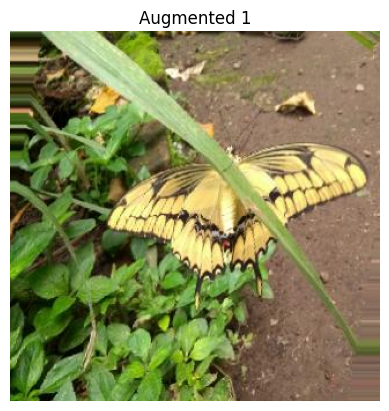

Processing category: Heliconius antiochus
Current image count in Heliconius antiochus: 33
Augmenting image: /content/drive/MyDrive/butterfly_dataset_images/Heliconius antiochus/2.jpg


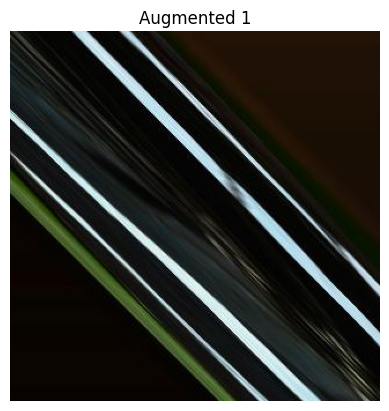

Processing category: Heliopetes arsalte
Current image count in Heliopetes arsalte: 37
Augmenting image: /content/drive/MyDrive/butterfly_dataset_images/Heliopetes arsalte/16.png


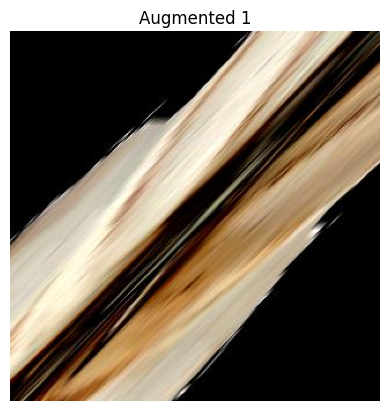

In [ ]:
# hier vind data augmentatie plaats
# Define augmentation parameters
import matplotlib.pyplot as plt
augmentation_parameters = {
    'shear_range': 0,
    # 'rotation_range': 15,
    # 'width_shift_range': 0.1,
    # 'height_shift_range': 0.1,
    # 'zoom_range': [0.5, 1.5],
    # 'horizontal_flip': True,
    # 'vertical_flip': True,
    'fill_mode': 'nearest'
}

# Maximum number of images per category
LIMIT_TO_AUGMENT = 0
NUM_OF_IMAGES_FOR_CATEGORY = 0
COUNTER = 0
NUM_TOTAL_IMAGES_FOR_CATEGORY = 280

# # Directory path containing category folders
# categories = ["category1", "category2"]  # Replace with your actual category names
# augmentedButterflyImagesPath = "path_to_augmented_images/"  # Replace with your base directory

# clear all content from folder containing augmented butterly images, before starting data augmentation process
if len(os.listdir(augmentedButterflyImagesPath)) != 0:
  clear_folder_content(augmentedButterflyImagesPath)


# Loop through categories and augment images
for category in categories:
    print(f"Processing category: {category}")
    image_path_dir = os.path.join(butterflyDatasetImagesPath, category)
    augmented_images_dir = os.path.join(augmentedButterflyImagesPath, category)



    # Create the directory if it doesn't exist
    os.makedirs(augmented_images_dir, exist_ok=True)

    NUM_OF_IMAGES_FOR_CATEGORY = len(os.listdir(image_path_dir))
    LIMIT_TO_AUGMENT = NUM_TOTAL_IMAGES_FOR_CATEGORY - NUM_OF_IMAGES_FOR_CATEGORY

    current_images = os.listdir(image_path_dir)
    print(f"Current image count in {category}: {len(current_images)}")

        # Iterate through existing images to augment
    for current_image in current_images:
      image_path = os.path.join(image_path_dir, current_image)
      print(f"Augmenting image: {image_path}")
      augment_single_image(
          image_path=image_path,
          save_dir=augmented_images_dir,
          augmentation_params=augmentation_parameters,
          num_augmentations=1
          )
      break;

    augmentedImages = os.listdir(augmented_images_dir)
    for image in augmentedImages:
      img_path = os.path.join(augmented_images_dir, image)
      img = load_img(img_path)
      plt.subplot(1, len(os.listdir(augmented_images_dir)),  1)
      plt.imshow(img)
      plt.title(f"Augmented {1}")
      plt.axis('off')
      plt.show()





In [ ]:
# hier vind data augmentatie plaats
# Define augmentation parameters
augmentation_parameters = {
    'shear_range': 0.2,
    'rotation_range': 0.2,
    'width_shift_range': 0.2,
    'height_shift_range': 0.2,
    'zoom_range': 0.2,
    'horizontal_flip': True,
    'vertical_flip': True,
    'rescale': 1./255,
    'fill_mode': 'nearest'
}

# Maximum number of images per category
LIMIT_TO_AUGMENT = 0
NUM_OF_IMAGES_FOR_CATEGORY = 0
COUNTER = 0
NUM_TOTAL_IMAGES_FOR_CATEGORY = 280

# # Directory path containing category folders
# categories = ["category1", "category2"]  # Replace with your actual category names
# augmentedButterflyImagesPath = "path_to_augmented_images/"  # Replace with your base directory

# clear all content from folder containing augmented butterly images, before starting data augmentation process
if len(os.listdir(augmentedButterflyImagesPath)) != 0:
  clear_folder_content(augmentedButterflyImagesPath)


# Loop through categories and augment images
for category in categories:
    print(f"Processing category: {category}")
    image_path_dir = os.path.join(butterflyDatasetImagesPath, category)
    augmented_images_dir = os.path.join(augmentedButterflyImagesPath, category)



    # Create the directory if it doesn't exist
    os.makedirs(augmented_images_dir, exist_ok=True)

    NUM_OF_IMAGES_FOR_CATEGORY = len(os.listdir(image_path_dir))
    LIMIT_TO_AUGMENT = NUM_TOTAL_IMAGES_FOR_CATEGORY - NUM_OF_IMAGES_FOR_CATEGORY

    while len(os.listdir(augmented_images_dir)) < LIMIT_TO_AUGMENT:
        current_images = os.listdir(image_path_dir)
        print(f"Current image count in {category}: {len(current_images)}")

        # Iterate through existing images to augment
        for current_image in current_images:
            image_path = os.path.join(image_path_dir, current_image)

            print(f"Augmenting image: {image_path}")

            augment_single_image(
                image_path=image_path,
                save_dir=augmented_images_dir,
                augmentation_params=augmentation_parameters,
                num_augmentations=1
            )

            # Break early if the directory reaches the limit
            if len(os.listdir(augmented_images_dir)) >= LIMIT_TO_AUGMENT:
                print(f"Reached limit for category: {category}")
                break

    print(f"Finished augmenting category: {category}\n")

In [ ]:
# SPLIT THE DATA IN TRAIN AND VALIDATION (not testing)
# HIER WORDT DATA VANUIT DE SOURCE ('augmented_butterfly_images' folder) GEBRACHT
# NAAR DE TARGET FOLDER ('dataset_for_model')
splitsize = 0.85
def split_data(SOURCES, TRAINING, VALIDATION, SPLIT_SIZE):
  files=[]
  for SOURCE in SOURCES:
    for file_name in os.listdir(SOURCE):
      file_dir = SOURCE + file_name
      # print(file)

      if os.path.getsize(file_dir) > 0 :
        print("file dir: "+ file_dir)
        files.append(file_dir)
      else:
        print(file_dir + " is 0 length , ignore it")

  trainingsLength = int(len(files) * SPLIT_SIZE) # 0.85 van de files wordt als training data gebruikt
  print("trainingsLength: "+ str(trainingsLength))
  shuffleSet = random.sample(files, len(files))
  trainingSet = shuffleSet[0:trainingsLength]
  validSet = shuffleSet[trainingsLength:]

  # copy the train images

  for file_dir in trainingSet:
    filename = os.path.basename(file_dir)
    destination = TRAINING + filename
    # print("Copying training data..")
    shutil.copyfile(file_dir,destination)
    # print("Copying training data FINISHED")

  # copy the validation images

  for file_dir in validSet:
    filename = os.path.basename(file_dir)
    destination = VALIDATION + filename
    # print("Copying validation data..")
    shutil.copyfile(file_dir,destination)
    # print("Copying validation data FINISHED")

# buiten function

trainPath = target_folder +"/train"
validatePath = target_folder +"/validate"

# create the target folder
existDataSetPth = os.path.exists(trainPath)
if existDataSetPth==False:
  os.mkdir(trainPath)

existDataSetPth = os.path.exists(validatePath)
if existDataSetPth==False:
  os.mkdir(validatePath)

# lets run the function for each of the folders

for category in categories:
  trainDestPath = trainPath + "/" + category
  validateDestPath = validatePath + "/" + category

  if os.path.exists(trainDestPath)==False:
    os.mkdir(trainDestPath)
  if os.path.exists(validateDestPath)==False:
    os.mkdir(validateDestPath)

  sourcepaths = []

  originalDatasetCategoryPath = butterflyDatasetImagesPath + "/" + category + "/"
  augmentedCategoryPath = augmentedButterflyImagesPath + "/" + category + "/"

  sourcepaths.append(originalDatasetCategoryPath)
  sourcepaths.append(augmentedCategoryPath)

  trainDestPath = trainDestPath + "/"
  validateDestPath = validateDestPath + "/"

  split_data(sourcepaths , trainDestPath, validateDestPath,splitsize)

  # Utility function to remove unwanted directories

remove_unwanted_dir(trainPath, ['.ipynb_checkpoints'])
remove_unwanted_dir(validatePath, ['.ipynb_checkpoints'])

In [4]:
# creation of Categories
import os
trainPath = target_folder +"/train"
validatePath = target_folder +"/validate"
categories = os.listdir(trainPath)
categories.sort()
print(categories)

['Heliconius antiochus', 'Heliopetes arsalte', 'Heraclides thoas']


In [5]:
# FUNCTIONS TO BE USED IN THE FOLLOWING CODES
import os
import glob
import numpy as np
from tensorflow.keras.preprocessing import image
from PIL import Image
def classify_image(imageFile):
  x = []
  img = Image.open(imageFile)

  img.load()
  img = img.resize((320,320))

  x = image.img_to_array(img)
  x= np.expand_dims(x, axis = 0)

  print(x.shape)

  pred = model.predict(x)
  print(pred * 100)

  categoryValue = np.argmax(pred, axis=1)
  categoryValue = categoryValue[0]

  print(categoryValue)

  result = categories[categoryValue]

  return result



def get_last_modified_model(folder_path: str) -> str:
    # Get all .keras and .tflite files in the folder
    keras_files = glob.glob(os.path.join(folder_path, '*.keras'))
    tflite_files = glob.glob(os.path.join(folder_path, '*.tflite'))

    # Combine both file lists
    files = keras_files + tflite_files

    if not files:
        return None  # No files in the folder

    # Sort files by modification time (latest first)
    latest_file = max(files, key=os.path.getmtime)

    return latest_file

/usr/local/lib/python3.10/dist-packages/keras/src/applications/mobilenet_v3.py:452: UserWarning: `input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default.
  return MobileNetV3(


Testing image: danausplexipus.jpeg


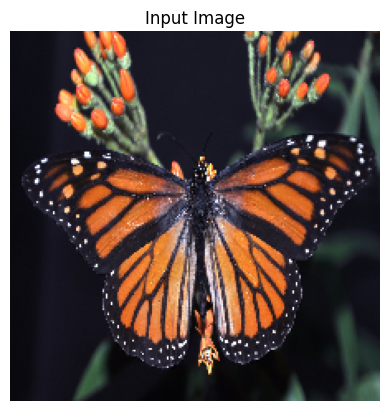

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Predictions:
1: monarch (90.29%)
2: lacewing (0.27%)
3: admiral (0.17%)
Testing image: WIN_20241015_22_50_33_Pro.jpg


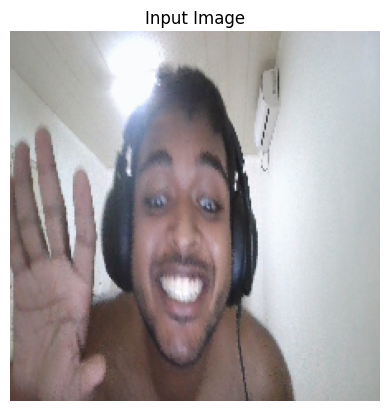

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Predictions:
1: bath_towel (18.71%)
2: shower_cap (5.77%)
3: Band_Aid (3.49%)
Testing image: WIN_20241117_17_02_24_Pro.jpg


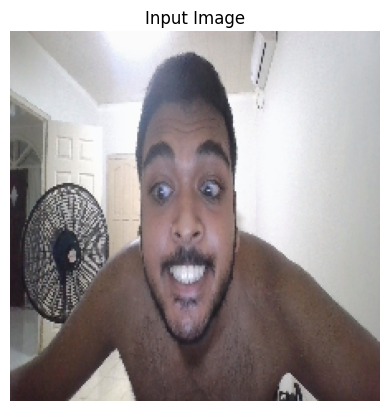

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Predictions:
1: shower_cap (13.66%)
2: dumbbell (7.80%)
3: chain_mail (4.24%)
Testing image: WIN_20241117_17_02_27_Pro.jpg


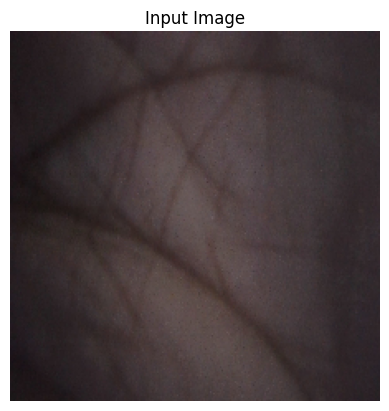

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Predictions:
1: Band_Aid (11.93%)
2: sleeping_bag (7.07%)
3: quilt (5.26%)
Testing image: selfieman.jpeg


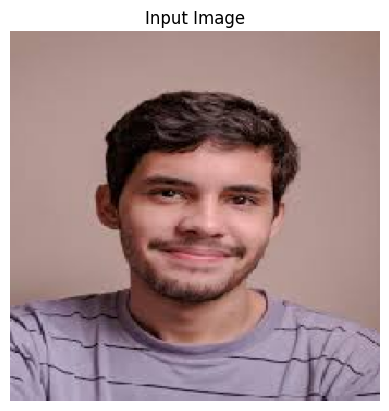

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Predictions:
1: lab_coat (8.54%)
2: jersey (8.39%)
3: neck_brace (4.18%)
Testing image: test black image.jpeg


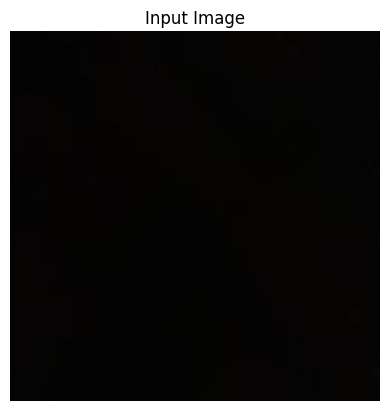

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Predictions:
1: nematode (3.54%)
2: matchstick (2.45%)
3: digital_clock (2.18%)
Testing image: test yellow with structure.jpeg


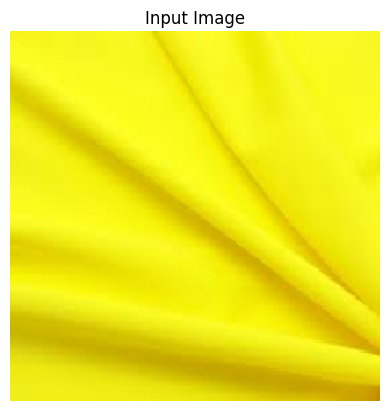

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Predictions:
1: daisy (17.07%)
2: ladybug (8.38%)
3: ant (7.65%)
Testing image: test yellow image.png


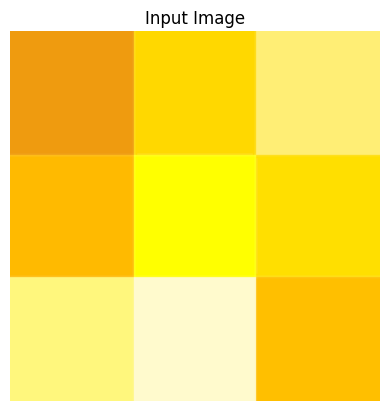

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Predictions:
1: envelope (17.69%)
2: web_site (4.35%)
3: rule (2.33%)
Testing image: test yellow flower.jpeg


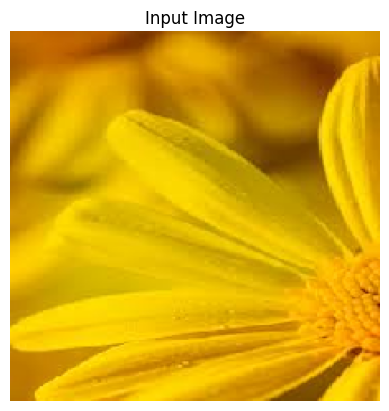

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Predictions:
1: daisy (45.48%)
2: sulphur_butterfly (12.17%)
3: cabbage_butterfly (8.01%)


In [ ]:
# Code to test images with pretraining, unmodified mobileNetV3 model
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input, decode_predictions
import matplotlib.pyplot as plt

# Load the base MobileNetV3Small model pre-trained on ImageNet
model = MobileNetV3Small(weights='imagenet', include_top=True)  # include_top=True for classification

# Function to preprocess images and make predictions
def test_image(image_path, model):
    # Load and preprocess the image
    image = load_img(image_path, target_size=(224, 224))  # MobileNetV3Small expects 224x224 images
    plt.imshow(image)
    plt.axis('off')
    plt.title("Input Image")
    plt.show()

    image_array = img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
    image_array = preprocess_input(image_array)  # Preprocess for MobileNetV3Small

    # Make predictions
    predictions = model.predict(image_array)
    decoded_predictions = decode_predictions(predictions, top=3)  # Get top-3 predictions

    # Print the predictions
    print("Predictions:")
    for i, (imagenet_id, label, score) in enumerate(decoded_predictions[0]):
        print(f"{i + 1}: {label} ({score * 100:.2f}%)")

# List of image paths to test
# test_images = [
#    testButterflyImages + "heraclides thoas - test5.jpg"
# ]
image_directory= testNonButterflyImages

# Loop through all files in the directory

# Loop through the test images and make predictions
for butterflyName in os.listdir(image_directory):
    print(f"Testing image: {butterflyName}")
    test_image(image_directory + butterflyName, model)


In [ ]:
# TRAINING THE MODEL
import numpy as np
import matplotlib.pyplot as plt
import datetime
import os
import shutil
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback
from tensorflow.keras import backend as K
import tensorflowjs as tfjs
import datetime

# nodige vars
MIN_LR = 0.00005
MAX_LR = 0.0001
BATCH_SIZE = 32

numberOfClasses = len(categories)

target_folder = googleDrivePath + trainingAndValidationDatasetFolder

trainPath = target_folder +"/train/";
validatePath = target_folder +"/validate/";

trainGenerator = ImageDataGenerator(
    rotation_range=15, width_shift_range=0.1,
    height_shift_range=0.1,
    brightness_range=(0, 0.2)).flow_from_directory(trainPath,
                                                   target_size=(320,320),
                                                   batch_size=32)

validateGenerator = ImageDataGenerator(
    rotation_range=15, width_shift_range=0.1,
    height_shift_range=0.1,
    brightness_range=(0, 0.2)).flow_from_directory(validatePath,
                                                   target_size=(320,320),
                                                   batch_size=32)
num_images = trainGenerator.n
BATCH = trainGenerator.batch_size
STEPS_PER_EPOCH = np.ceil(num_images / BATCH)
STEP_SIZE = STEPS_PER_EPOCH * 8



previously_trained_model_path = get_last_modified_model(modelKerasPath)


%load_ext tensorboard



check_and_create_folder(modelTrainingLogsPath)

if os.path.exists(modelTrainingLogsPath):
    shutil.rmtree(modelTrainingLogsPath)  # Deletes the directory and all its contents
    os.mkdir(modelTrainingLogsPath)

logdir = os.path.join(modelTrainingLogsPath, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=1)

earlyStoppingCallback = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=10,
                              verbose=0,
                              mode='auto',
                              restore_best_weights=True)

# deze functie regelt de learning rate tijdens runtime volgens de Cyclic rate methode (traingular algoritme)
def scheduler(epoch, lr):
  total_steps = epoch * STEPS_PER_EPOCH
  cycle = np.floor(1 + total_steps / (2 * STEP_SIZE))
  x = np.abs(total_steps / STEP_SIZE - 2 * cycle + 1)
  lr = MIN_LR + (MAX_LR - MIN_LR) * np.maximum(0, (1 - x))
  return lr

# input shape is gezet op 320,320,3 (eerste 2 zijn height en width, 3e is de color channel)
model = MobileNetV3Small(weights='imagenet', include_top=False, input_shape=(320, 320, 3)) # include_top=False haalt de laatste layer weg (classification layer)


x = model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation ='relu')(x)
x = Dense(256, activation ='relu')(x)
x = Dense(128, activation ='relu')(x)

#deze laatste 5 layers zijn zelf geadd
predictionLayer = Sequential([  # Add an intermediate layer if needed
    Dense(numberOfClasses, activation='softmax')
])(x)


model = tf.keras.Model(inputs=model.input, outputs=predictionLayer)

# if USE_PREVIOUSLY_TRAINED_MODEL:
#     # Load the pre-trained model from the saved file
#     baseModel = tf.keras.models.load_model(previously_trained_model_path)
#     print(f"Loaded pre-trained model from {previously_trained_model_path}")
# else:
#     # Use MobileNetV3Small as the base model
#     baseModel = MobileNetV3Small(weights='imagenet', include_top=False, input_shape=(320, 320, 3))
#     print("Using MobileNetV3Small as the base model")

# print(model.summary())

# freeze the layers of the model that are already trained


# for layer in model.layers[:-5]: # Train de laatste 5 layers
#   layer.trainable = False


# Compile
callbackLearningRate = tf.keras.callbacks.LearningRateScheduler(scheduler)

optimizer = Adam(learning_rate = MIN_LR)
model.compile(loss = "categorical_crossentropy",
              optimizer= optimizer,
              metrics=["accuracy"])

#train
model.fit(trainGenerator, validation_data= validateGenerator,epochs=100, callbacks=[tensorboard_callback, earlyStoppingCallback,callbackLearningRate])

# nadat het trainen al is voltooid, worden de nodige metrics displayed op tensorboard
%tensorboard --logdir {logdir}

currentTime = datetime.datetime.now()

modelDateTrained = currentTime.strftime("%Y-%m-%d_%H:%M")

modelSavedPath = modelKerasPath + f'__{modelDateTrained}.keras'


try:
    os.remove(modelSavedPath)
    print(f"File '{modelSavedPath}' has been removed.")
except FileNotFoundError:
    print(f"File '{modelSavedPath}' does not exist.")
except PermissionError:
    print(f"Permission denied: Unable to delete '{modelSavedPath}'.")
except OSError as e:
    print(f"Error: {e.strerror} - {e.filename}")


model.save(modelSavedPath)

Found 714 images belonging to 3 classes.
Found 126 images belonging to 3 classes.
Map '/content/drive/MyDrive/model_training_logs/' already exists.


/usr/local/lib/python3.10/dist-packages/keras/src/applications/mobilenet_v3.py:452: UserWarning: `input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default.
  return MobileNetV3(


4334752/4334752 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 360s 11s/step - accuracy: 0.4430 - loss: 1.0672 - val_accuracy: 0.5317 - val_loss: 1.0398 - learning_rate: 5.0000e-05
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 116s 5s/step - accuracy: 0.8235 - loss: 0.7618 - val_accuracy: 0.6032 - val_loss: 0.9058 - learning_rate: 5.6250e-05
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 114s 5s/step - accuracy: 0.9150 - loss: 0.4296 - val_accuracy: 0.8016 - val_loss: 0.6276 - learning_rate: 6.2500e-05
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 109s 4s/step - accuracy: 0.9352 - loss: 0.1939 - val_accuracy: 0.8492 - val_loss: 0.4983 - learning_rate: 6.8750e-05
Epoch 5/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 140s 4s/step - accuracy: 0.9605 - loss: 0.1318 - val_accuracy: 0.8413 - val_loss: 0.4093 - learning_rate: 7.5000e-05
Epoch 6/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 109s 4s/step - accuracy: 0.9686 - loss: 0.0760 - val_accuracy: 0.7857 - val_loss: 0.4176 - learning_rate: 8.1250e-05
Epoch 7/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 147s 4s/step - accuracy: 0.9822 - lo

<IPython.core.display.Javascript object>

File '/content/drive/MyDrive/AI_model_keras/__2024-11-24_22:31.keras' does not exist.


In [ ]:
# OM TE TESTEN OF HET KERAS MODEL EEN IMAGE KAN CLASSIFYEN

import tensorflow as tf
import cv2

target_folder = googleDrivePath + trainingAndValidationDatasetFolder
trainPath = target_folder +"/train";


modelSavedPath= get_last_modified_model(modelKerasPath)
model= tf.keras.models.load_model(modelSavedPath)


butterflyName='test3.jpg'
img_path = "/content/drive/MyDrive/OOD data/" + butterflyName
resultText= classify_image(img_path)
print(resultText)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
[[0.34424362 0.32095256 0.33480388]]
Entropic Score of images.jpeg: -1.0981996059417725
Predicted class: 0
Confidence: 0.34

Skipping non-image file: wfw.webp
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
[[0.34325358 0.32117903 0.33556744]]
Entropic Score of heliconius_antiochus.jpeg: -1.0982342958450317
Predicted class: 0
Confidence: 0.34

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
[[0.34535378 0.31903392 0.3356123 ]]
Entropic Score of heliopetes arsalte(2).jpeg: -1.0980792045593262
Predicted class: 0
Confidence: 0.35

Skipping non-image file: .ipynb_checkpoints
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
[[0.34516868 0.31792057 0.33691075]]
Entropic Score of Heliconius antiochus.jpeg: -1.0980236530303955
Predicted class: 0
Confidence: 0.35

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
[[0.34642732 0.31974605 0.3338266 ]]
Entropic Score of heraclides thoas - test1.jpg: -1.0980772972106934
Predicted class: 0
Confidence: 0.35

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
[[0.3464349

In [ ]:
# CONVERT MODEL TO TFLITE

import tensorflow as tf
import os
import datetime


modelSavedPath= get_last_modified_model(modelKerasPath)
model= tf.keras.models.load_model(modelSavedPath)
# # Convert the model

converter = tf.lite.TFLiteConverter.from_keras_model(model)
# converter.optimizations = [tf.lite.Optimize.DEFAULT]


# # Explicitly set the input shape (matching your ImageDataGenerator)
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]
# input_shape = [1, 320, 320, 3]
# converter.inference_input_shape = input_shape

# tflite_model = converter.convert()
# path to the SavedModel directory
try:
    tflite_model = converter.convert()
    print("Model converted successfully.")
except Exception as e:
    print(f"Error during conversion: {e}")

currentTime = datetime.datetime.now()

modelDateTrained = currentTime.strftime("%Y-%m-%d_%H:%M")

tflite_model_path = modelTFLitePath + f'__{modelDateTrained}.tflite'

try:
    os.remove(tflite_model_path)
    print(f"File '{tflite_model_path}' has been removed.")
except FileNotFoundError:
    print(f"File '{tflite_model_path}' does not exist.")
except PermissionError:
    print(f"Permission denied: Unable to delete '{tflite_model_path}'.")
except OSError as e:
    print(f"Error: {e.strerror} - {e.filename}")

# Save the model.
with open(tflite_model_path, 'wb') as f:
  f.write(tflite_model)

Saved artifact at '/tmp/tmpgvy15lik'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 320, 320, 3), dtype=tf.float32, name='input_layer')
Output Type:
  TensorSpec(shape=(None, 3), dtype=tf.float32, name=None)
Captures:
  135643800484528: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135643800544608: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135643800546720: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135643800540032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135643800542320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135643800548128: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135643800455472: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135643800459696: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135643800457056: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135643800457760: TensorSpec(shape=(), dtype=tf.resource, name=None)
  135643800463568

In [ ]:
# OM TE TESTEN OF HET TF lite MODEL EEN IMAGE KAN CLASSIFYEN
import tensorflow as tf
import os
from tensorflow.keras.preprocessing import image
from PIL import Image
import numpy as np

# get last modified TF model
tflite_model_path = modelTFLitePath + "__2024-11-17_19:37.tflite"



# Load the TFLite model
interpreter = tf.lite.Interpreter(model_path=tflite_model_path)
interpreter.allocate_tensors()



# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# print("\nVolledige input tensor: ")
# print(input_details[0]);

# print("\nOnvolledige input tensor: ")
# print(input_details[0]['shape']);

# print("\nvolledige output tensor: ")
# print(output_details);
# print("\noutput tensor op [0]:")
# print(output_details[0]);


# Load and preprocess the image


# Path to the directory containing images
image_directory= testNonButterflyImages

# Loop through all files in the directory
for butterflyName in os.listdir(image_directory):
    # Construct full image path
    img_path = os.path.join(image_directory, butterflyName)

    # Check if the file is an image (optional)
    if not butterflyName.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
        print(f"Skipping non-image file: {butterflyName}")
        continue

    # Load and preprocess image
    img = Image.open(img_path).resize((input_details[0]['shape'][1], input_details[0]['shape'][2]))
    img = np.array(img).astype(np.float32)

    # Add batch dimension
    input_data = np.expand_dims(img, axis=0)

    # Set the tensor for input data
    interpreter.set_tensor(input_details[0]['index'], input_data)

    # Run inference
    interpreter.invoke()

    # Get the output tensor
    output_details_output = interpreter.get_output_details()
    output_data = interpreter.get_tensor(output_details_output[0]['index'])

    # Calculate entropy and entropic score
    entropy = -tf.reduce_sum(output_data * tf.math.log(output_data + 1e-8), axis=1)
    entropic_score = -entropy

    # Print results for the current image
    # print(f"\nProcessing {butterflyName}:")
    # print("Entropy:", entropy.numpy())
    print(f"Entropic Score of {butterflyName}: {entropic_score.numpy()[0]}")

    for output in output_data:
        for outputty in output:
            print(f"Prediction: {outputty * 100:.2f}%")

    categoryValue1 = np.argmax(output_data, axis=1)[0]
    print(f"Predicted category index: {categoryValue1}", end='\n\n')




In [ ]:
# Mahalananobis distance
import tensorflow as tf
import os
from PIL import Image
import numpy as np

# Path to the TFLite model
tflite_model_path = modelTFLitePath + "__2024-11-17_19:37.tflite"

# Load the TFLite model
interpreter = tf.lite.Interpreter(model_path=tflite_model_path)
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Get penultimate layer details
# Assuming the second-to-last output tensor corresponds to the penultimate layer
penultimate_layer_index = -2  # Update if needed
penultimate_layer_details = output_details[penultimate_layer_index]

# Path to the directory containing test images
image_directory = testNonButterflyImages

# Precomputed class statistics (example values; replace with actual precomputed values)
class_means = np.load("class_means.npy")  # Precomputed means of penultimate layer features for each class
class_covariance = np.load("class_covariance.npy")  # Precomputed shared covariance matrix of features
inv_covariance = np.linalg.inv(class_covariance)  # Precompute inverse of covariance matrix

# Function to compute Mahalanobis Distance
def mahalanobis_distance(features, class_means, inv_covariance):
    """
    Compute the Mahalanobis Distance for features against class means.
    Parameters:
        features: Feature vector of the test sample.
        class_means: Mean feature vectors for each class.
        inv_covariance: Inverse of the shared covariance matrix.
    Returns:
        distances: Array of Mahalanobis Distances to each class.
    """
    distances = []
    for mean in class_means:
        diff = features - mean
        distance = np.sqrt(np.dot(np.dot(diff, inv_covariance), diff.T))
        distances.append(distance)
    return distances

# Loop through all files in the directory
for butterflyName in os.listdir(image_directory):
    # Construct full image path
    img_path = os.path.join(image_directory, butterflyName)

    # Check if the file is an image (optional)
    if not butterflyName.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
        print(f"Skipping non-image file: {butterflyName}")
        continue

    # Load and preprocess image
    img = Image.open(img_path).resize((input_details[0]['shape'][1], input_details[0]['shape'][2]))
    img = np.array(img).astype(np.float32)

    # Add batch dimension
    input_data = np.expand_dims(img, axis=0)

    # Set the tensor for input data
    interpreter.set_tensor(input_details[0]['index'], input_data)

    # Run inference
    interpreter.invoke()

    # Extract penultimate layer features
    penultimate_features = interpreter.get_tensor(penultimate_layer_details['index'])[0]  # Extract first sample's features

    # Compute Mahalanobis Distances
    distances = mahalanobis_distance(penultimate_features, class_means, inv_covariance)

    # Find the minimum distance (closest class)
    min_distance = np.min(distances)

    # Print results for the current image
    print(f"Processing {butterflyName}:")
    print(f"Mahalanobis Distance to Closest Class: {min_distance:.4f}")


In [6]:
# YOLO MODEL INSTALLATION
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.3/896.3 kB 16.5 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO11n model
model = YOLO("yolo11n.pt")


# results = model(testButterflyImages+'heliopetes arsalte(4).jpeg', save=True, show=True)


model.predict(testNonButterflyImages+'testbutterfly.jpeg', save=True, imgsz=320, conf=0.5, show=True)

# Run batched inference on a list of images
# results = model([testButterflyImages+'heliopetes arsalte(4).jpeg', testButterflyImages+'Heliconius antiochus(1).jpeg'])  # return a list of Results objects

# # Process results list
# for result in results:
#     boxes = result.boxes  # Boxes object for bounding box outputs
#     masks = result.masks  # Masks object for segmentation masks outputs
#     keypoints = result.keypoints  # Keypoints object for pose outputs
#     probs = result.probs  # Probs object for classification outputs
#     obb = result.obb  # Oriented boxes object for OBB outputs
#     result.show()  # display to screen
#     result.save(filename="/content/drive/MyDrive/test_images/results_yolo/result.jpg")  # save to disk

In [9]:
from ultralytics import YOLO
import datetime

model = YOLO("yolo11s.pt")  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data="/content/drive/MyDrive/YOLO_dataset/butterfly detection.v1i.yolov11/data.yaml", epochs=100, imgsz=640, patience=50)  # train the model
currentTime = datetime.datetime.now()

modelDateTrained = currentTime.strftime("%Y-%m-%d_%H:%M")

modelSavedPath = YOLOModelPath + f'__{modelDateTrained}.pt'


try:
    os.remove(modelSavedPath)
    print(f"File '{modelSavedPath}' has been removed.")
except FileNotFoundError:
    print(f"File '{modelSavedPath}' does not exist.")
except PermissionError:
    print(f"Permission denied: Unable to delete '{modelSavedPath}'.")
except OSError as e:
    print(f"Error: {e.strerror} - {e.filename}")


model.save(modelSavedPath)

Ultralytics 8.3.38 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/content/drive/MyDrive/YOLO_dataset/butterfly detection.v1i.yolov11/data.yaml, epochs=100, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop

train: Scanning /content/drive/MyDrive/YOLO_dataset/butterfly detection.v1i.yolov11/train/labels.cache... 126 images, 0 backgrounds, 0 corrupt: 100%|██████████| 126/126 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/YOLO_dataset/butterfly detection.v1i.yolov11/valid/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.53G      1.301      4.582      1.831         47        640: 100%|██████████| 8/8 [00:03<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         20         20      0.136      0.387      0.153      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.33G     0.4735      2.744      1.217         50        640: 100%|██████████| 8/8 [00:02<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all         20         20      0.557      0.533      0.251      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.32G     0.2264      1.761       1.03         53        640: 100%|██████████| 8/8 [00:02<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         20         20      0.177      0.919      0.366      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.34G     0.2152      1.575     0.9922         39        640: 100%|██████████| 8/8 [00:02<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         20         20      0.592      0.453      0.357      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.34G     0.2243      1.338     0.9994         47        640: 100%|██████████| 8/8 [00:03<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all         20         20      0.422      0.502      0.375       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.34G     0.2541      1.214      1.004         42        640: 100%|██████████| 8/8 [00:02<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

                   all         20         20      0.359      0.353      0.227      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.34G     0.2485       1.19      1.006         43        640: 100%|██████████| 8/8 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         20         20      0.327      0.418      0.278      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.34G     0.2443      1.111      1.013         45        640: 100%|██████████| 8/8 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

                   all         20         20      0.181      0.393      0.279      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.34G     0.2409      1.078      1.007         45        640: 100%|██████████| 8/8 [00:03<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all         20         20      0.187      0.514      0.254      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.32G     0.2381      1.063     0.9806         45        640: 100%|██████████| 8/8 [00:03<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         20         20      0.281      0.437      0.195      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.34G     0.2684      1.067     0.9815         41        640: 100%|██████████| 8/8 [00:02<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

                   all         20         20      0.395       0.54      0.259      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.32G     0.2597      1.051      1.002         55        640: 100%|██████████| 8/8 [00:02<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         20         20      0.153      0.427       0.16     0.0977



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.32G      0.245      1.053      1.002         39        640: 100%|██████████| 8/8 [00:03<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

                   all         20         20     0.0424      0.133      0.045      0.017



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.32G     0.2459      1.021     0.9874         47        640: 100%|██████████| 8/8 [00:04<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

                   all         20         20      0.458     0.0667     0.0404     0.0258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.32G     0.2904     0.9854     0.9959         45        640: 100%|██████████| 8/8 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all         20         20      0.291      0.367     0.0724     0.0453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.32G     0.2486     0.9676      0.968         44        640: 100%|██████████| 8/8 [00:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

                   all         20         20      0.284       0.17     0.0499     0.0447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.32G      0.261     0.8848     0.9812         43        640: 100%|██████████| 8/8 [00:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

                   all         20         20      0.695      0.224       0.15     0.0854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.32G     0.2472     0.8739     0.9787         44        640: 100%|██████████| 8/8 [00:03<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

                   all         20         20      0.641      0.167     0.0797      0.039



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      4.32G     0.2323     0.8968     0.9854         49        640: 100%|██████████| 8/8 [00:03<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all         20         20      0.694       0.08      0.109     0.0421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.32G     0.2349     0.9295     0.9577         45        640: 100%|██████████| 8/8 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.98it/s]

                   all         20         20      0.674       0.16      0.176      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.32G     0.2189     0.8275     0.9608         40        640: 100%|██████████| 8/8 [00:02<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

                   all         20         20      0.548      0.533      0.286      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.32G     0.2352     0.8372     0.9493         48        640: 100%|██████████| 8/8 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

                   all         20         20      0.337      0.467      0.328      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.32G     0.2292     0.7685     0.9713         40        640: 100%|██████████| 8/8 [00:03<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         20         20      0.716      0.207      0.188      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.32G      0.212     0.8448     0.9667         39        640: 100%|██████████| 8/8 [00:03<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

                   all         20         20      0.791      0.253      0.298      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.32G     0.2225     0.7666     0.9404         40        640: 100%|██████████| 8/8 [00:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]

                   all         20         20      0.561      0.253      0.327       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.32G     0.2328     0.8767     0.9711         44        640: 100%|██████████| 8/8 [00:02<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

                   all         20         20      0.481      0.501      0.495      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      4.32G     0.2043     0.7487     0.9391         47        640: 100%|██████████| 8/8 [00:02<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         20         20       0.55       0.38      0.449      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.32G     0.1902     0.7659     0.9371         38        640: 100%|██████████| 8/8 [00:03<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

                   all         20         20      0.595      0.355      0.269      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.32G     0.1831      0.687     0.9342         45        640: 100%|██████████| 8/8 [00:03<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

                   all         20         20       0.23      0.605      0.386      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.32G     0.1817     0.5938     0.9456         45        640: 100%|██████████| 8/8 [00:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


                   all         20         20      0.444      0.608      0.353       0.31

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      4.32G     0.2012     0.7117     0.9504         42        640: 100%|██████████| 8/8 [00:02<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

                   all         20         20      0.431      0.547      0.255      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.32G     0.1895     0.6946     0.9362         39        640: 100%|██████████| 8/8 [00:02<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

                   all         20         20      0.373      0.353      0.289      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      4.32G     0.1791     0.6762     0.9286         40        640: 100%|██████████| 8/8 [00:03<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

                   all         20         20        0.4      0.413      0.281      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.32G     0.1714     0.6714      0.934         40        640: 100%|██████████| 8/8 [00:03<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all         20         20       0.22      0.673      0.305      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      4.32G     0.1868      0.719     0.9337         40        640: 100%|██████████| 8/8 [00:03<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all         20         20      0.646      0.407      0.499      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.32G     0.2082     0.7171     0.9812         41        640: 100%|██████████| 8/8 [00:03<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]

                   all         20         20      0.636      0.325      0.335      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      4.32G     0.1814      0.638     0.9339         36        640: 100%|██████████| 8/8 [00:03<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

                   all         20         20      0.541       0.36      0.269      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.32G     0.1818      0.659     0.9303         48        640: 100%|██████████| 8/8 [00:03<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         20         20       0.59      0.427      0.383      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.32G     0.1769     0.6022     0.9317         47        640: 100%|██████████| 8/8 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]

                   all         20         20      0.688      0.378      0.333      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.32G     0.1675     0.5461     0.9311         38        640: 100%|██████████| 8/8 [00:02<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

                   all         20         20      0.688      0.367      0.282       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      4.32G      0.171     0.5531     0.9286         42        640: 100%|██████████| 8/8 [00:02<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         20         20      0.377      0.407      0.298       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      4.32G     0.1736     0.5546     0.9491         51        640: 100%|██████████| 8/8 [00:03<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all         20         20      0.382      0.288      0.299      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.32G     0.1631     0.5802     0.9348         44        640: 100%|██████████| 8/8 [00:03<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.27it/s]

                   all         20         20      0.401      0.513      0.349      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.32G       0.17     0.5163     0.9373         38        640: 100%|██████████| 8/8 [00:02<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


                   all         20         20      0.583       0.36      0.386      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.32G     0.1645     0.5328     0.9168         38        640: 100%|██████████| 8/8 [00:02<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

                   all         20         20      0.468       0.56      0.407      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.32G     0.1588     0.5122     0.9414         42        640: 100%|██████████| 8/8 [00:02<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         20         20      0.456      0.541      0.303      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.32G     0.1668     0.5694     0.9307         39        640: 100%|██████████| 8/8 [00:03<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all         20         20      0.452      0.495      0.274      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.32G     0.1561     0.5547     0.9077         48        640: 100%|██████████| 8/8 [00:02<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]

                   all         20         20      0.393      0.381      0.289      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.32G     0.1544     0.5516      0.937         44        640: 100%|██████████| 8/8 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]

                   all         20         20      0.524      0.458      0.349      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.32G     0.1535     0.4963      0.933         43        640: 100%|██████████| 8/8 [00:02<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]

                   all         20         20      0.489      0.513       0.38      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      4.32G     0.1514     0.5179     0.9308         50        640: 100%|██████████| 8/8 [00:03<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         20         20      0.411      0.452      0.326      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.32G     0.1489     0.4795     0.9251         42        640: 100%|██████████| 8/8 [00:03<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         20         20      0.427      0.457      0.348      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.32G     0.1398     0.4598     0.9171         37        640: 100%|██████████| 8/8 [00:02<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

                   all         20         20      0.443      0.372      0.379      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.32G     0.1461     0.4605      0.933         43        640: 100%|██████████| 8/8 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]

                   all         20         20      0.719      0.384      0.362      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.32G     0.1506     0.5073     0.9335         44        640: 100%|██████████| 8/8 [00:02<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

                   all         20         20      0.618      0.467      0.384      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.32G     0.1414     0.5022     0.9167         39        640: 100%|██████████| 8/8 [00:03<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         20         20      0.435      0.497      0.368      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.32G     0.1523     0.4757     0.9228         42        640: 100%|██████████| 8/8 [00:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         20         20      0.477      0.467      0.368      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.32G      0.138     0.4437     0.9179         41        640: 100%|██████████| 8/8 [00:02<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]

                   all         20         20      0.388      0.555       0.33      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.32G     0.1452     0.4867     0.9324         44        640: 100%|██████████| 8/8 [00:02<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]

                   all         20         20      0.373       0.48      0.296       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.32G     0.1381     0.4688     0.9126         39        640: 100%|██████████| 8/8 [00:02<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

                   all         20         20      0.364      0.469      0.311      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.32G     0.1392     0.4391     0.9055         47        640: 100%|██████████| 8/8 [00:03<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

                   all         20         20      0.381      0.467      0.311      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.32G     0.1396      0.442     0.9179         32        640: 100%|██████████| 8/8 [00:03<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         20         20      0.435      0.529      0.302      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.32G     0.1328     0.4376     0.9153         44        640: 100%|██████████| 8/8 [00:02<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]

                   all         20         20       0.45      0.493      0.328      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.32G     0.1517     0.4544     0.9454         39        640: 100%|██████████| 8/8 [00:02<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]

                   all         20         20      0.514      0.499      0.401      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.32G     0.1355      0.417     0.9106         50        640: 100%|██████████| 8/8 [00:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         20         20      0.332      0.535      0.434      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.32G     0.1414      0.427     0.9416         43        640: 100%|██████████| 8/8 [00:03<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         20         20      0.585      0.399      0.438      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.32G     0.1416      0.417      0.932         41        640: 100%|██████████| 8/8 [00:03<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         20         20       0.61       0.36      0.411      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.32G     0.1239     0.3865     0.9302         43        640: 100%|██████████| 8/8 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

                   all         20         20      0.468      0.452      0.358      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.32G      0.117     0.3742     0.9167         43        640: 100%|██████████| 8/8 [00:02<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

                   all         20         20       0.47      0.447      0.334      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.32G     0.1287      0.414      0.914         46        640: 100%|██████████| 8/8 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         20         20      0.458      0.447       0.31      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.32G     0.1293     0.3965     0.9217         38        640: 100%|██████████| 8/8 [00:03<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

                   all         20         20      0.199      0.933      0.294       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.32G     0.1163     0.3708     0.8971         45        640: 100%|██████████| 8/8 [00:03<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all         20         20      0.184      0.933      0.302      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.32G     0.1255     0.3785     0.9198         43        640: 100%|██████████| 8/8 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]

                   all         20         20      0.155      0.867      0.294      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.32G     0.1222     0.3925     0.9041         47        640: 100%|██████████| 8/8 [00:02<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all         20         20      0.173      0.933      0.306      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.32G     0.1347     0.4064     0.9331         49        640: 100%|██████████| 8/8 [00:02<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         20         20      0.418      0.453      0.312      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.32G     0.1226      0.353     0.9036         49        640: 100%|██████████| 8/8 [00:03<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         20         20      0.399      0.417      0.296      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.32G     0.1182     0.3462     0.9285         41        640: 100%|██████████| 8/8 [00:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

                   all         20         20      0.221      0.533      0.303      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.32G     0.1173      0.336       0.92         47        640: 100%|██████████| 8/8 [00:02<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]

                   all         20         20      0.201      0.513      0.304      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      4.32G     0.1146     0.3322     0.9067         40        640: 100%|██████████| 8/8 [00:02<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]

                   all         20         20       0.22       0.58      0.305        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.32G     0.1125     0.3322     0.9075         45        640: 100%|██████████| 8/8 [00:02<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         20         20      0.268      0.426      0.313      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.32G     0.1042     0.3266     0.9043         46        640: 100%|██████████| 8/8 [00:03<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all         20         20      0.286      0.486      0.318      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      4.32G     0.1128     0.3361     0.9103         43        640: 100%|██████████| 8/8 [00:03<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

                   all         20         20      0.274      0.453      0.319      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      4.32G      0.115      0.328     0.9084         43        640: 100%|██████████| 8/8 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

                   all         20         20      0.255      0.475      0.305      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      4.32G     0.1131     0.3146     0.9104         42        640: 100%|██████████| 8/8 [00:02<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

                   all         20         20      0.257      0.482      0.299      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.32G     0.1136     0.2642     0.9248         36        640: 100%|██████████| 8/8 [00:02<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

                   all         20         20      0.282      0.513      0.313      0.305
EarlyStopping: Training stopped early as no improvement observed in last 50 epochs. Best results observed at epoch 35, best model saved as best.pt.
To update EarlyStopping(patience=50) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



85 epochs completed in 0.107 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 19.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.38 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11s summary (fused): 238 layers, 9,414,735 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


                   all         20         20      0.646      0.407      0.499      0.498
  butterfly front view          3          3          1          0     0.0802     0.0771
butterfly leftside view          3          3      0.192      0.667      0.307      0.307
butterfly rightside view          3          3      0.489      0.667      0.423      0.423
   butterfly side view          1          1          1          0      0.995      0.995
    butterfly top view         10         10      0.547        0.7      0.689      0.689
Speed: 0.2ms preprocess, 5.2ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/train2
File '/content/drive/MyDrive/YOLO_models/__2024-11-28_01:41.pt' does not exist.


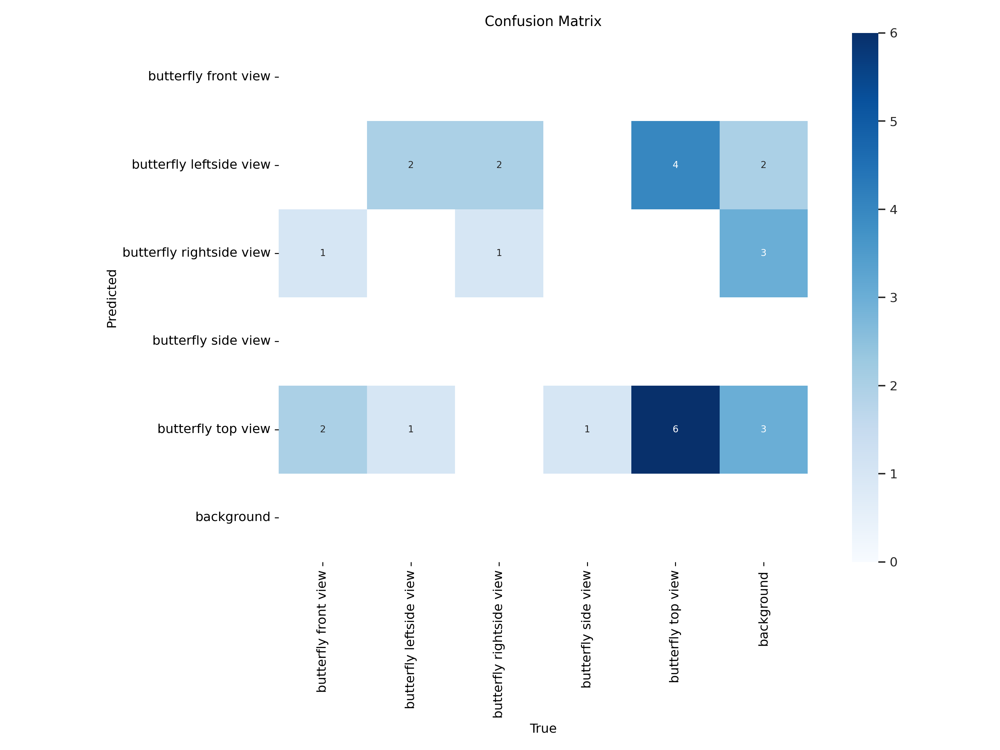

In [10]:
# Confusion matrix YOLO
import os
from IPython.display import display,Image
Image(filename='/content/runs/detect/train2/confusion_matrix.png', width=900)

In [13]:
# validation of YOLO model
from ultralytics import YOLO

model = YOLO(YOLOModelPath+"__2024-11-28_01:41(last).pt")

model.val(source="/content/drive/MyDrive/YOLO_dataset/butterfly detection.v1i.yolov11/data.yaml")

Ultralytics 8.3.38 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11s summary (fused): 238 layers, 9,414,735 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning /content/drive/MyDrive/YOLO_dataset/butterfly detection.v1i.yolov11/valid/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]


                   all         20         20      0.282      0.513      0.313      0.305
  butterfly front view          3          3          0          0     0.0398     0.0398
butterfly leftside view          3          3      0.275      0.667      0.304      0.274
butterfly rightside view          3          3       0.33          1      0.388      0.388
   butterfly side view          1          1          0          0     0.0255     0.0255
    butterfly top view         10         10      0.805        0.9      0.806      0.796
Speed: 0.3ms preprocess, 20.0ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect/val3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c1dabfdec20>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [16]:
from ultralytics import YOLO
import os

# Load a COCO-pretrained YOLO model
model = YOLO(YOLOModelPath + "__2024-11-28_01:41(best).pt")

# Define the directory containing test images
test_images_dir = testButterflyImages  # Replace with your directory path
assert os.path.exists(test_images_dir), f"Directory '{test_images_dir}' does not exist."

# Ensure the directory contains valid image files
image_files = [f for f in os.listdir(test_images_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
assert image_files, f"No valid images found in the directory: {test_images_dir}"

# Iterate through all images and run predictions
for image_file in image_files:
    image_path = os.path.join(test_images_dir, image_file)

    # Perform prediction
    results = model.predict(image_path, save=True, imgsz=320, conf=0.5, show=False)

    # Optionally print some details about the results
    print(f"Processed '{image_file}', detections: {len(results[0])}")

print("Predictions completed for all images.")



image 1/1 /content/drive/MyDrive/test_images/butterflies/images.jpeg: 256x320 1 butterfly front view, 37.7ms
Speed: 1.3ms preprocess, 37.7ms inference, 2.2ms postprocess per image at shape (1, 3, 256, 320)
Results saved to runs/detect/predict3
Processed 'images.jpeg', detections: 1

image 1/1 /content/drive/MyDrive/test_images/butterflies/heliconius_antiochus.jpeg: 256x320 1 butterfly leftside view, 47.7ms
Speed: 1.0ms preprocess, 47.7ms inference, 16.0ms postprocess per image at shape (1, 3, 256, 320)
Results saved to runs/detect/predict3
Processed 'heliconius_antiochus.jpeg', detections: 1

image 1/1 /content/drive/MyDrive/test_images/butterflies/heliopetes arsalte(2).jpeg: 224x320 1 butterfly top view, 55.0ms
Speed: 3.5ms preprocess, 55.0ms inference, 4.0ms postprocess per image at shape (1, 3, 224, 320)
Results saved to runs/detect/predict3
Processed 'heliopetes arsalte(2).jpeg', detections: 1

image 1/1 /content/drive/MyDrive/test_images/butterflies/Heliconius antiochus.jpeg: 256

In [ ]:
# Object cropping code (gehaald uit chatgpt, alvast gesaved)
# File: object_cropping_images.py

import os
import cv2
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator, colors

# Load YOLO model
model = YOLO("yolo11n.pt")
names = model.names  # Get the class names used by the model

# Directory for input images
input_dir = "path/to/images"  # Replace with the actual path to your images
assert os.path.exists(input_dir), "Input directory does not exist."

# Directory for saving cropped images
crop_dir_name = "ultralytics_crop_images"
if not os.path.exists(crop_dir_name):
    os.mkdir(crop_dir_name)

# Iterate over all image files in the directory
image_files = [f for f in os.listdir(input_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
assert image_files, "No image files found in the input directory."

idx = 0  # Counter for cropped object images
for image_file in image_files:
    # Read the image
    image_path = os.path.join(input_dir, image_file)
    im0 = cv2.imread(image_path)
    assert im0 is not None, f"Failed to read the image: {image_path}"

    # Predict objects in the image
    results = model.predict(im0, show=False)
    boxes = results[0].boxes.xyxy.cpu().tolist()  # Bounding boxes
    clss = results[0].boxes.cls.cpu().tolist()  # Class IDs
    annotator = Annotator(im0, line_width=2, example=names)

    # Process detected objects
    for box, cls in zip(boxes, clss):
        idx += 1
        annotator.box_label(box, color=colors(int(cls), True), label=names[int(cls)])  # Annotate image

        # Crop the object from the image
        crop_obj = im0[int(box[1]):int(box[3]), int(box[0]):int(box[2])]

        # Save the cropped object
        crop_file_path = os.path.join(crop_dir_name, f"crop_{idx}.png")
        cv2.imwrite(crop_file_path, crop_obj)

    # Optionally display the annotated image
    cv2.imshow("YOLO Object Cropping", im0)

    # Press 'q' to quit the loop early
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

# Cleanup
cv2.destroyAllWindows()

print(f"Cropped objects saved in '{crop_dir_name}'.")
